# 1. Define the Business case and load first data

You have a business with stores at different locations in the US and one large store in Mexico.
To get more insights into the sales of the stores and what factors influence that you want to do a data analysis. Each store has different department, where you know the weekly sales.

In a database you found a table with weekly sales for each store and downloaded it (stores.csv). We can read that table and have a first look.

In [ ]:
import pandas as pd

In [ ]:
#read the data and already define that one column contains a date
stores = pd.read_csv("stores.csv",parse_dates=["Date"])

<ipython-input-12-19af9df5ee5a>:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  stores = pd.read_csv("stores.csv",parse_dates=["Date"])


In [ ]:
#show the first few lines
stores.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-05-02,24924.50,False
1,1,1,2010-12-02,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-05-03,21827.90,False


In [ ]:
#Build a report of the data
!pip install pandas_profiling
from pandas_profiling import ProfileReport
ProfileReport(stores)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Based on that:

**What questions do you have about the data?**

# 2. Further investigation and cleaning



Observations:
* Some weekly sales are very large and some have negative sales. Maybe data is not consistent
* We do only have IDs for the stores and departments
* It is not clear if all stores report the Weekly_Sales on the same day
* It is not clear how "isHoliday" is defined on a weekly basis
* Not all stores have the same number of departments

We only consider the first case and look at the sales per store

Text(0.5, 0, 'Store')

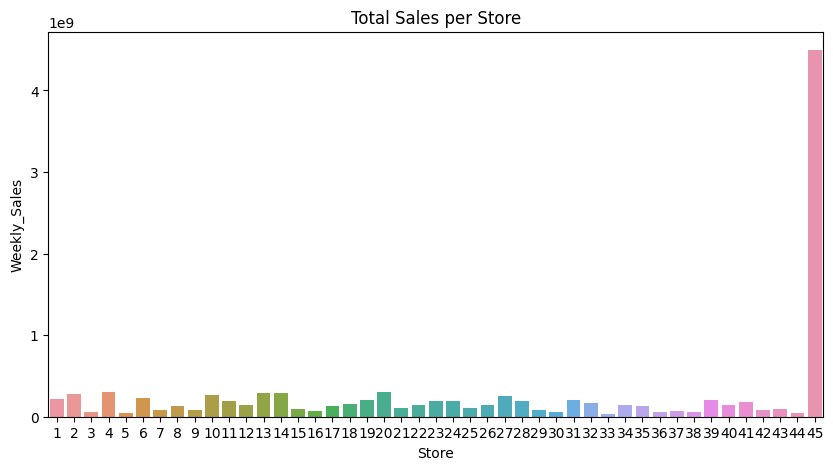

In [ ]:
#plot the total sales per store
import matplotlib.pyplot as plt
import seaborn as sns
sales_perStore = stores.groupby('Store').agg({"Weekly_Sales":"sum"})
plt.figure(figsize=(10, 5))
sns.barplot(x=sales_perStore.index,y=sales_perStore.Weekly_Sales)
plt.title("Total Sales per Store")
plt.xlabel("Store")

The last store seems to be way off. After looking at it in detail we found that this is the store in Mexico and it is in a different currency. For some comparisons it would be necessary to get the FX rate for each week and convert it. For simplicity we now take it as fixed 1USD=20 Pesos.


In [ ]:
stores.loc[stores['Store'] == 45, 'Weekly_Sales'] = stores.loc[stores['Store'] == 45, 'Weekly_Sales'] / 20

Text(0.5, 0, 'Store')

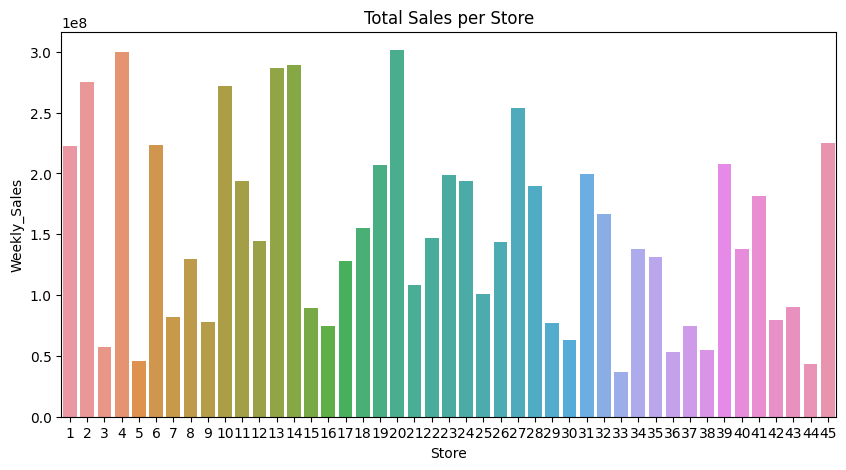

In [ ]:
#plot the total sales per store
import matplotlib.pyplot as plt
import seaborn as sns
sales_perStore = stores.groupby('Store').agg({"Weekly_Sales":"sum"})
plt.figure(figsize=(10, 5))
sns.barplot(x=sales_perStore.index,y=sales_perStore.Weekly_Sales)
plt.title("Total Sales per Store")
plt.xlabel("Store")

Now it looks better. As we know that the store in Mexico is huge the distribution looks reasonable.

# 3. Get additional data

To get insights we need additional data that can be either from an internal database or from another source.

**What could be interesting to investigate in combination with the dataset already seen?**

A lot of data that is specific for the date or location could be intersting.

This could include special day, weather data, economical data, seasonality or special offers in the store.

We got a dataset that has such features in features.csv

In [ ]:
#read data
features = pd.read_csv("features.csv",parse_dates=["Date"])

<ipython-input-18-0175cb0bb163>:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  features = pd.read_csv("features.csv",parse_dates=["Date"])


In [ ]:
features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-05-02,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-12-02,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-05-03,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
ProfileReport(features)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**What are some intersting observations?**

# 4. Cleaning of features

Markable observations are:

*   The temperature is up to 999 and also on average quite high. 999 is most likely an error and otherwise in Fahrenheit
*   Markdown is divided into 5 columns. It is not clear what each means
*   There are some missing values for CPI and Unemployment
*   isHoliday is again in the table
*   ...


We will now remove all columns with outliers and missing values.
Beside removing there are also other strategies like replacing it with the mean value or take for temperature the last temperature at that location.

In [ ]:

#remove temperature outliers
import numpy as np
P = np.percentile(features.Temperature, [5, 95])
features_cleaned = features[(features.Temperature > P[0]) & (features.Temperature < P[1])]

#remove missing
features_cleaned = features_cleaned.dropna(subset=['CPI', 'Unemployment'])



Now we have two datasets that we can combine, such that all is in one table. We will add the information from the features to each columns with the same store and date.

In [ ]:
#merge data and only keep that information that is present in both datasets
merged = pd.merge(stores, features, left_index=True,right_index=True, how='inner')

In [ ]:
merged.head()

,Store_x,Dept,Date_x,Weekly_Sales,IsHoliday_x,Store_y,Date_y,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y
0,1,1,2010-05-02,24924.50,False,1,2010-05-02,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,1,2010-12-02,46039.49,True,1,2010-12-02,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,1,2010-02-19,41595.55,False,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,1,2010-02-26,19403.54,False,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,1,2010-05-03,21827.90,False,1,2010-05-03,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


**What plots could now be helpful for that data?**

# 5. Get Insights

We could for example:


*   Look at correlation and find important factors
*   Plot the timeline for each store and together
*   Make a prediction/forecast of the sales
*   Find stores that are similar in performance (cluster)
*   Find additional data that could help e.g. plan new stores

We will quickly do a correlation plot and look at the timeline of all stores combines

<Axes: title={'center': 'Unemployment'}, xlabel='Date'>

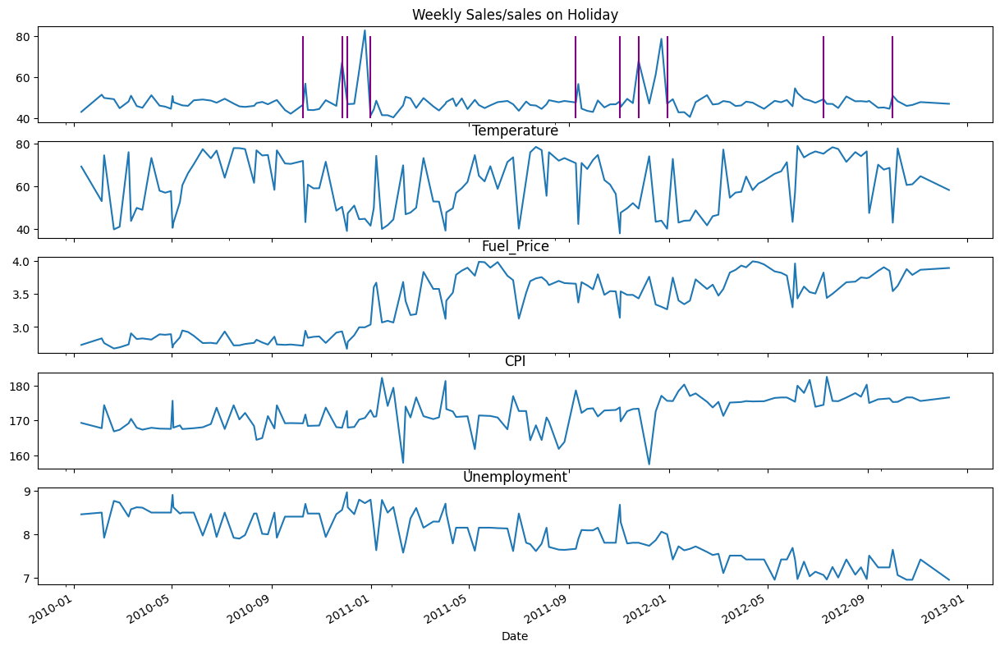

In [ ]:
#first we group (similar to pivot in excel) the data for each day. For this we take the Features and define how the columns should be aggregated (agg). For most features the mean is interesting and for isHoliday we take the sum to know at how many locations there is a holiday
aggregated_sales = stores.groupby("Date").agg({  "Weekly_Sales": "sum"})
features_cleaned["IsHoliday"] = features_cleaned["IsHoliday"].astype(int)
aggregated_features = features_cleaned.groupby("Date").agg({  "Temperature":"mean"
                                            ,"Fuel_Price":"mean"
                                            ,"CPI":"mean"
                                           ,"Unemployment":"mean"
                                           , "IsHoliday": "sum"})
#the date used for grouping is the index, which can be used to sort
aggregated_sales = aggregated_sales.sort_index()
aggregated_features = aggregated_features.sort_index()

aggregated_sales["Weekly_Sales"] = aggregated_sales["Weekly_Sales"] / 1000000

merged = pd.merge(aggregated_sales, aggregated_features, left_index=True,right_index=True, how='left')

#We also define, that there is Holiday if the sum of holidays across all stores is fullfilled. This is now a binary information either there is holiday (True) or not (False)
merged["IsHoliday"] = merged["IsHoliday"] > 1

#Next we look at the timeline and make a plot for all 5 values. The holidays are shown as vertical lines for the weekly sales
#define the plot as having 5 stacked plots
fig, ax = plt.subplots(5,1,figsize=(15,10),sharex=True)
#plot sales on first axes
merged["Weekly_Sales"].plot(ax=ax[0],title="Weekly Sales/sales on Holiday")
#plot vertical lines for the holiday
ax[0].vlines(x = merged.loc[merged['IsHoliday']].index, ymin = 40, ymax = 80,
           colors = 'purple',
           label = 'vline_multiple - full height')
#TODO: Add plot for Temperature, Fuel_Price, CPI and Unemployment on the plot 1-4
merged["Temperature"].plot(ax=ax[1], title="Temperature")
merged["Fuel_Price"].plot(ax=ax[2],title="Fuel_Price")
merged["CPI"].plot(ax=ax[3],title="CPI")
merged["Unemployment"].plot(ax=ax[4],title="Unemployment")


It could also be interesting to investigate if there are correlations between some of the features we have with weekly sales.

<Axes: >

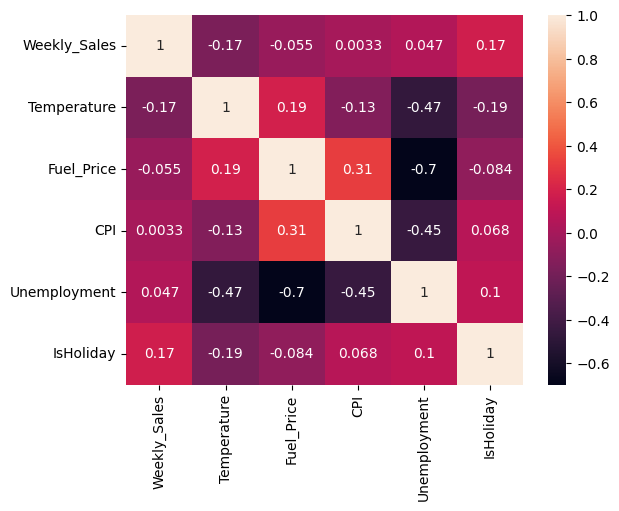

In [ ]:
sns.heatmap(merged.corr(),annot=True)

We can see that there is a small correlation between holidays and sales. In addition the temperature seems to be negatively correlated with the sales.
By interpreting such information is should always be considered that there may be other influence. For example the seasonality can influence temperature, holidays but also weekly sales.